In [1]:
import numpy as np
import xarray as xr
import os
from matplotlib import pyplot as plt
from tqdm import tqdm
from wavediffusion.waveana import assemble 
import cartopy.crs as ccrs
from wavediffusion.waveutils import plot_sample_parts
%load_ext autoreload
%autoreload 2

# Open a random raw file to get lat and lon
ds = xr.open_dataset('/global/homes/j/jiarongw/scratch_folder/wave_data/raw/LOPS_WW3-GLOB-30M_202109.nc')
lat_deg = ds.latitude[1:-2].values
lon_deg = ds.longitude.values

In [2]:
# Sample scenario to analyze 2004_DDPM_40steps_100_20ensem_extra
path = '/global/homes/j/jiarongw/scratch_folder/log1p/waveparts_hist/2004/'

In [25]:
from wavediffusion.waveutils import plot_wave
index = 240
x_truth = np.load(f'{path}truth_{index}.npy')
x_mean = np.load(f'{path}mean_{index}.npy')
x_sample = np.load(f'{path}sample_{index}.npy')
x_std = np.load(f'{path}std_{index}.npy')

In [5]:
def plot_sample_parts(x_true, x_sample):
    fig, axes = plt.subplots(4, 3, figsize=[35, 15], dpi=100)
    titles = ['wave height','wave period','direction']
    
    imgs = [
        axes[0, 0].imshow(x_true[0], vmin=0, vmax=10, cmap='Blues'),
        axes[0, 1].imshow(x_true[1], vmin=0, vmax=20, cmap='Reds'),
        axes[0, 2].imshow(x_true[2], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[0, 0].set_ylabel(f"Truth partition 1", fontsize=14, labelpad=40)
    for j in range(3):
        axes[0,j].set_xticks([]); axes[0,j].set_yticks([])
        axes[0,j].set_title(titles[j])
        fig.colorbar(imgs[j], ax=axes[0,j], fraction=0.046, pad=0.04)
        
    imgs = [
        axes[1, 0].imshow(x_sample[0], vmin=0, vmax=10, cmap='Blues'),
        axes[1, 1].imshow(x_sample[1], vmin=0, vmax=20, cmap='Reds'),
        axes[1, 2].imshow(x_sample[2], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[1, 0].set_ylabel(f"Sampled partition 1", fontsize=14, labelpad=40)
    for j in range(3):
        axes[1,j].set_xticks([]); axes[1,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[1,j], fraction=0.046, pad=0.04)  
        
    imgs = [
        axes[2, 0].imshow(x_true[3], vmin=0, vmax=10, cmap='Blues'),
        axes[2, 1].imshow(x_true[4], vmin=0, vmax=20, cmap='Reds'),
        axes[2, 2].imshow(x_true[5], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[2, 0].set_ylabel(f"Truth partition 2", fontsize=14, labelpad=40)
    for j in range(3):
        axes[2,j].set_xticks([]); axes[2,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[2,j], fraction=0.046, pad=0.04)  

    imgs = [
        axes[3, 0].imshow(x_sample[3], vmin=0, vmax=10, cmap='Blues'),
        axes[3, 1].imshow(x_sample[4], vmin=0, vmax=20, cmap='Reds'),
        axes[3, 2].imshow(x_sample[5], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[3, 0].set_ylabel(f"Sampled partition 2", fontsize=14, labelpad=40)
    for j in range(3):
        axes[3,j].set_xticks([]); axes[3,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[3,j], fraction=0.046, pad=0.04)  
        
    plt.tight_layout(rect=[0.12, 0, 1, 1])  # leave room on the left for text
    return fig

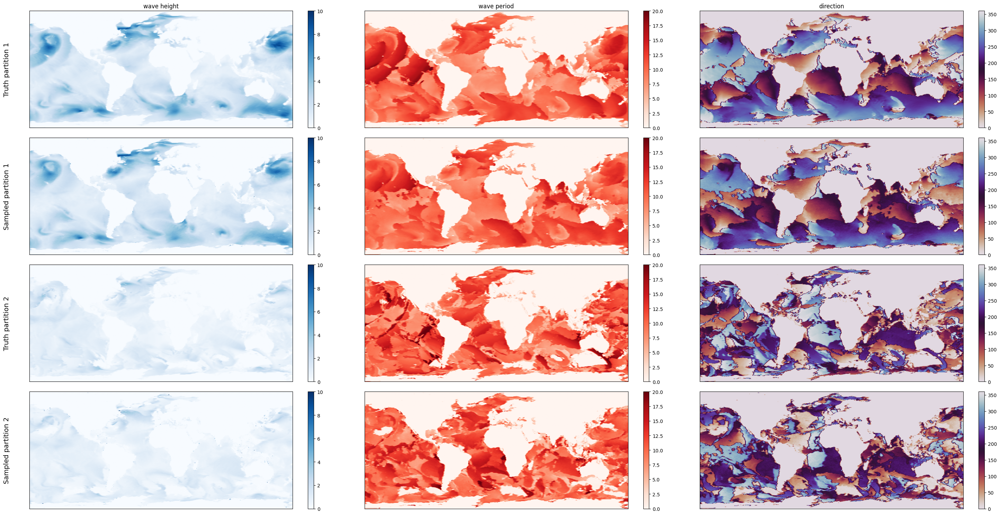

In [13]:
fig = plot_sample_parts(x_truth[:,::-1], x_sample[:,::-1])

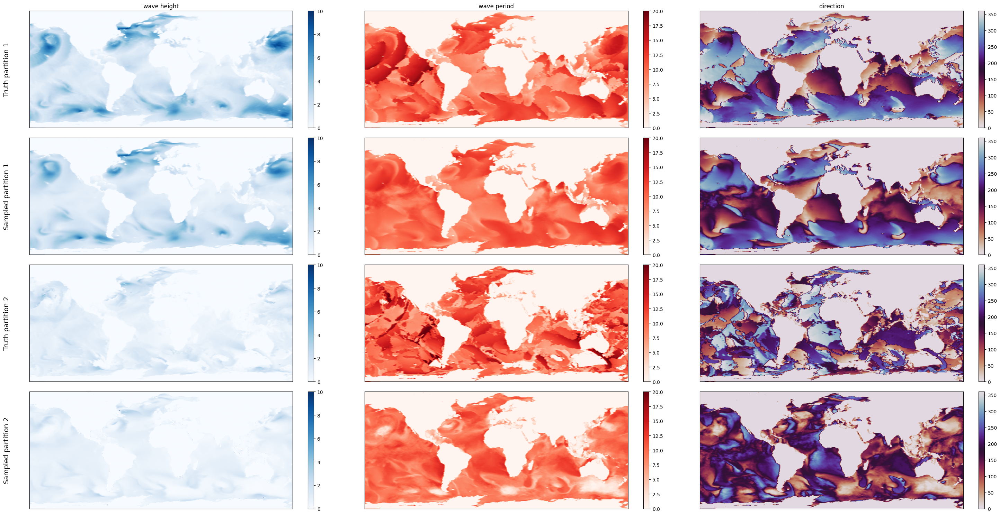

In [15]:
fig = plot_sample_parts(x_truth[:,::-1], x_mean[:,::-1])

In [61]:
def plot_sample_calibration(x_true, x_sample, x_std, ip=1):
    fig, axes = plt.subplots(4, 3, figsize=[35, 15], dpi=100)
    titles = ['wave height','wave period','direction']
    
    imgs = [
        axes[0, 0].imshow(x_true[0], vmin=0, vmax=10, cmap='Blues'),
        axes[0, 1].imshow(x_true[1], vmin=0, vmax=20, cmap='Reds'),
        axes[0, 2].imshow(x_true[2], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[0, 0].set_ylabel(f"Truth partition {ip}", fontsize=14, labelpad=40)
    for j in range(3):
        axes[0,j].set_xticks([]); axes[0,j].set_yticks([])
        axes[0,j].set_title(titles[j])
        fig.colorbar(imgs[j], ax=axes[0,j], fraction=0.046, pad=0.04)
        
    imgs = [
        axes[1, 0].imshow(x_sample[0], vmin=0, vmax=10, cmap='Blues'),
        axes[1, 1].imshow(x_sample[1], vmin=0, vmax=20, cmap='Reds'),
        axes[1, 2].imshow(x_sample[2], vmin=0, vmax=360, cmap='twilight_r'),
    ]
    axes[1, 0].set_ylabel(f"Sampled partition {ip}", fontsize=14, labelpad=40)
    for j in range(3):
        axes[1,j].set_xticks([]); axes[1,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[1,j], fraction=0.046, pad=0.04)  
        
    imgs = [
        axes[2, 0].imshow(x_std[0], vmin=0, vmax=1, cmap='Greens'),
        axes[2, 1].imshow(x_std[1], vmin=0, vmax=5, cmap='Greens'),
        axes[2, 2].imshow(x_std[2], vmin=0, vmax=90, cmap='Greens'),
    ]
    axes[2, 0].set_ylabel(f"Std partition {ip}", fontsize=14, labelpad=40)
    for j in range(3):
        axes[2,j].set_xticks([]); axes[2,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[2,j], fraction=0.046, pad=0.04)  

    imgs = [
        axes[3, 0].imshow(x_sample[0] - x_true[0], vmin=-1, vmax=1, cmap='RdBu_r'),
        axes[3, 1].imshow(x_sample[1] - x_true[1], vmin=-5, vmax=5, cmap='RdBu_r'),
        axes[3, 2].imshow(x_sample[2] - x_true[2], vmin=-90, vmax=90, cmap='RdBu_r'),
    ]
    axes[3, 0].set_ylabel(f"Error", fontsize=14, labelpad=40)
    for j in range(3):
        axes[3,j].set_xticks([]); axes[3,j].set_yticks([])
        fig.colorbar(imgs[j], ax=axes[3,j], fraction=0.046, pad=0.04)  
        
    plt.tight_layout(rect=[0.12, 0, 1, 1])  # leave room on the left for text
    return fig

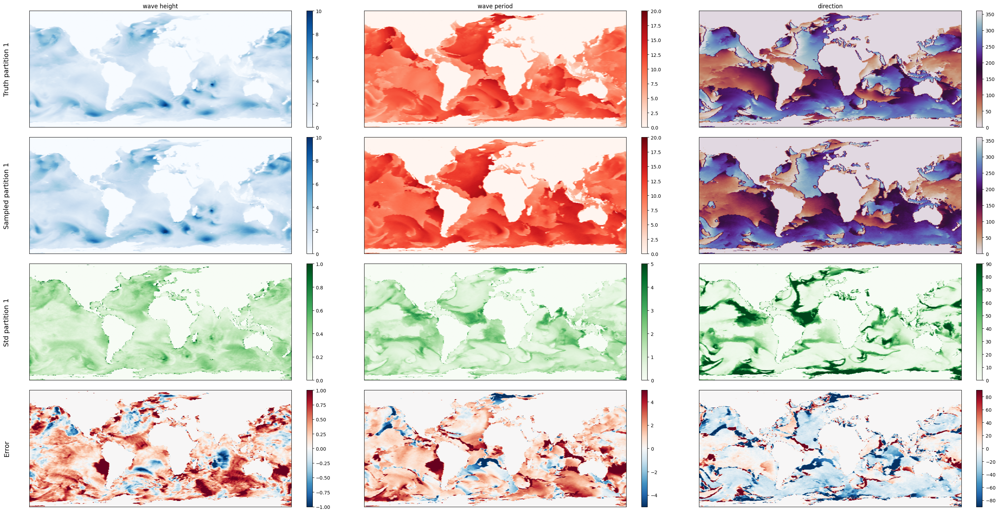

In [26]:
fig = plot_sample_calibration(x_truth[:,::-1], x_sample[:,::-1], x_std[:,::-1])

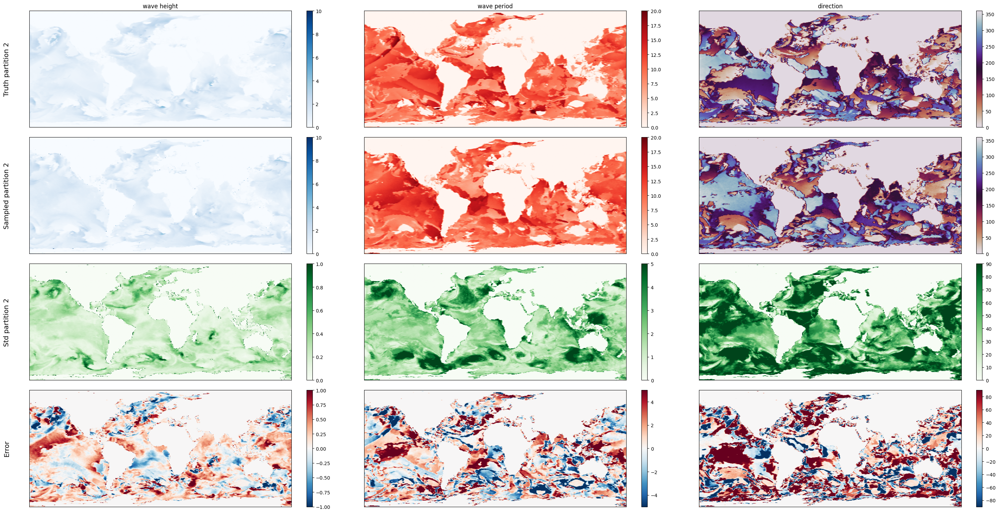

In [62]:
fig = plot_sample_calibration(x_truth[3:,::-1], x_sample[3:,::-1], x_std[3:,::-1], ip=2)

In [32]:
from wavediffusion.waveana import add_lat_lon
ds = xr.open_dataset('/global/homes/j/jiarongw/scratch_folder/wave_data/raw/LOPS_WW3-GLOB-30M_202109.nc')
lat_deg = ds.latitude[1:-2].values
lon_deg = ds.longitude.values

In [40]:
x_sample[6] = np.maximum(x_sample[6], 0)
x_sample[6] = np.minimum(x_sample[6], 1)
x_mean[6] = np.maximum(x_mean[6], 0)
x_mean[6] = np.minimum(x_mean[6], 1)
ds = add_lat_lon ((x_truth[6], x_sample[6], x_mean[6]), ('cf', 'cf_sample', 'cf_mean'))

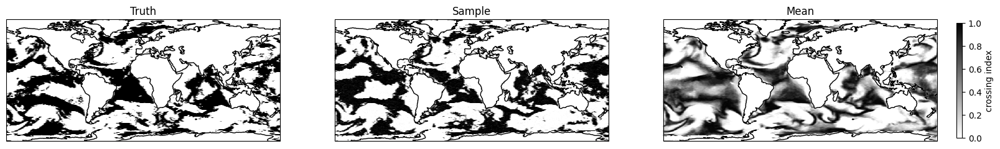

In [59]:
fig, axes = plt.subplots(1, 3, subplot_kw={'projection': ccrs.PlateCarree()},
                         figsize=[20, 3], sharey=True, dpi=100)

im = ds.cf.plot(ax=axes[0], vmax=1, vmin=0, cmap='binary',
                transform=ccrs.PlateCarree(), add_colorbar=False)
ds.cf_sample.plot(ax=axes[1], vmax=1, vmin=0, cmap='binary',
                  transform=ccrs.PlateCarree(), add_colorbar=False)
ds.cf_mean.plot(ax=axes[2], vmax=1, vmin=0, cmap='binary',
                transform=ccrs.PlateCarree(), add_colorbar=False)

# Add a single colorbar on the right, outside all three axes
cbar = fig.colorbar(im, ax=axes, orientation='vertical', 
                    fraction=0.015, pad=0.02, shrink=0.8)
cbar.set_label('crossing index')

for ax, title in zip(axes, ['Truth', 'Sample', 'Mean']):
    ax.coastlines()
    ax.set_title(title)

# plt.tight_layout()